In [40]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.metrics import confusion_matrix

import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from wordcloud import WordCloud
import re

import string
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Bidirectional, Dense, Dropout, SpatialDropout1D
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report
from tensorflow.keras.losses import categorical_crossentropy
from keras.optimizers import Adam

[nltk_data] Downloading package punkt to C:\Users\Anjelita
[nltk_data]     Malik\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
# load the dataset
data = pd.read_csv("cnbc_result.csv")

#check shape of the dataset
print("shape of the data:", data.shape)
data.head(5)

shape of the data: (2611, 4)


,Headline,Date,Link,Content
0,"Ekspor Pasir Laut Siap Dibuka, Pemerintah Jami...",2024-06-21 22:00:00,https://www.cnbcindonesia.com/news/20240621202...,pemerintah tengah bersiap merealisasikan ekspo...
1,"Ramai PHK di Pabrik Tekstil, Bos Bea Cukai Oga...",2024-06-21 19:45:00,https://www.cnbcindonesia.com/news/20240621192...,direktur jenderal bea cukai kementerian keuang...
2,"Barang Impor Hajar Pasar RI, Pengusaha Tekstil...",2024-06-21 14:57:00,https://www.cnbcindonesia.com/news/20240621145...,jakarta cnbc indonesia ketua umum ikatan pengu...
3,Pengusaha Tekstil Beberkan Borok Impor Merajal...,2024-06-20 20:20:00,https://www.cnbcindonesia.com/news/20240620172...,pengusaha tekstil di dalam negeri menyoroti pe...
4,"Jokowi Kumpulkan Menteri di Istana, Bahas 'Nar...",2024-06-20 10:35:00,https://www.cnbcindonesia.com/news/20240620103...,presiden joko widodo jokowi memanggil beberapa...


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2611 entries, 0 to 2610
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Headline  2611 non-null   object
 1   Date      2611 non-null   object
 2   Link      2611 non-null   object
 3   Content   1999 non-null   object
dtypes: object(4)
memory usage: 81.7+ KB


# Data Exploration


## Displays the entire dataset column

In [4]:
data.columns

Index(['Headline', 'Date', 'Link', 'Content'], dtype='object')

## Summary

In [5]:
# menampilkan ringkasan dataset yang berisi jumlah baris dan tipe data
info = data.info()
print('Ringkasan informasi:', info)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2611 entries, 0 to 2610
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Headline  2611 non-null   object
 1   Date      2611 non-null   object
 2   Link      2611 non-null   object
 3   Content   1999 non-null   object
dtypes: object(4)
memory usage: 81.7+ KB
Ringkasan informasi: None


## Find Data Duplicate

In [6]:
# Cek data duplikat
duplicate_rows = data[data.duplicated()]
print("Jumlah data duplikat:", duplicate_rows.shape[0])

Jumlah data duplikat: 0


## Find Missing Values

In [7]:
## Find Missing Values
# menghitung dan menampilkan missing values
print('Jumlah missing values disetiap kolom:\n', data.isnull().sum())

Jumlah missing values disetiap kolom:
 Headline      0
Date          0
Link          0
Content     612
dtype: int64


Dalam dataset hasil scraping berita dari situs CNBC Indonesia dengan keyword `bea cukai`, terdapat beberapa kolom yang memiliki missing values. Kolom `Headline`, `Date`, dan `Link` tidak memiliki missing values, artinya setiap artikel berita memiliki judul, tanggal publikasi, dan link yang lengkap. Namun, kolom `Content` memiliki 612 missing values. Ini menunjukkan bahwa ada 612 entri yang tidak memiliki konten artikel. Missing values pada kolom `Content` ini mungkin disebabkan oleh beberapa alasan, seperti kesalahan dalam proses scraping, artikel yang dihapus, atau artikel yang tidak memiliki teks yang dapat diakses. Mengingat pentingnya konten artikel dalam analisis sentimen, entri-entri yang tidak memiliki konten mungkin perlu dihapus atau diproses lebih lanjut untuk memastikan kualitas data yang digunakan dalam penelitian.

## Remove Missing Values

In [8]:
# Menghapus baris dengan nilai null dalam kolom "Content"
data = data.dropna(subset=['Content'])

# Menyimpan hasil preprocessing ke file CSV baru
# data.to_csv('cnbc_result_preprocessed.csv', index=False)

#check shape of the dataset
print("shape of the data:", data.shape)

shape of the data: (1999, 4)


## Separate the date in the timestamp of the At column

In [9]:
# memisahkan tanggal yang terletak di timestamps
data['Date'] = pd.to_datetime(data['Date']).dt.date
data.head()

,Headline,Date,Link,Content
0,"Ekspor Pasir Laut Siap Dibuka, Pemerintah Jami...",2024-06-21,https://www.cnbcindonesia.com/news/20240621202...,pemerintah tengah bersiap merealisasikan ekspo...
1,"Ramai PHK di Pabrik Tekstil, Bos Bea Cukai Oga...",2024-06-21,https://www.cnbcindonesia.com/news/20240621192...,direktur jenderal bea cukai kementerian keuang...
2,"Barang Impor Hajar Pasar RI, Pengusaha Tekstil...",2024-06-21,https://www.cnbcindonesia.com/news/20240621145...,jakarta cnbc indonesia ketua umum ikatan pengu...
3,Pengusaha Tekstil Beberkan Borok Impor Merajal...,2024-06-20,https://www.cnbcindonesia.com/news/20240620172...,pengusaha tekstil di dalam negeri menyoroti pe...
4,"Jokowi Kumpulkan Menteri di Istana, Bahas 'Nar...",2024-06-20,https://www.cnbcindonesia.com/news/20240620103...,presiden joko widodo jokowi memanggil beberapa...


In [10]:
# memisahkan tahun dan bulan
data['Year'] = pd.to_datetime(data['Date']).dt.year
data['Month'] = pd.to_datetime(data['Date']).dt.month

In [11]:
# Menghitung jumlah berita per tahun
yearly_counts = data['Year'].value_counts().sort_index()

# Data Visualization

C:\Users\Anjelita Malik\AppData\Local\Temp\ipykernel_18144\318751773.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=yearly_counts.index, y=yearly_counts.values, palette="pastel")


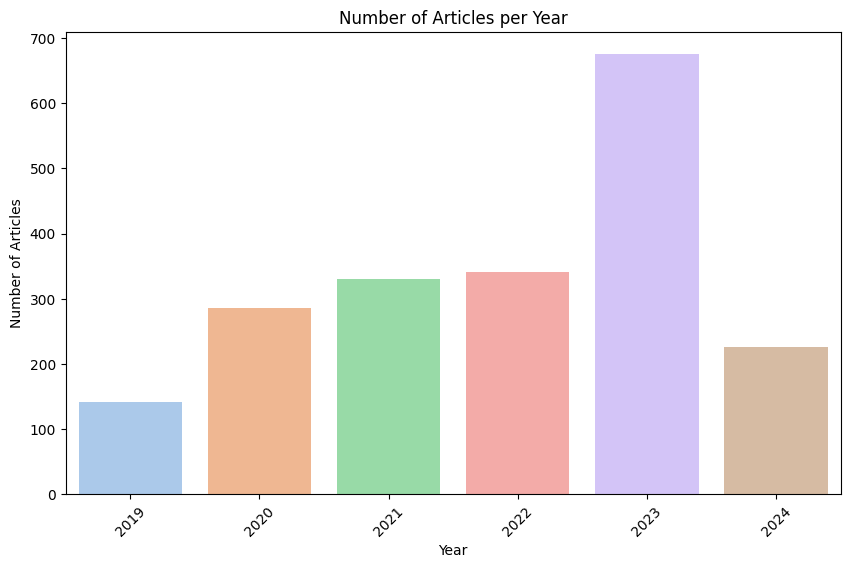

In [12]:
plt.figure(figsize=(10, 6))
sns.barplot(x=yearly_counts.index, y=yearly_counts.values, palette="pastel")
plt.xlabel('Year')
plt.ylabel('Number of Articles')
plt.title('Number of Articles per Year')
plt.xticks(rotation=45)
plt.show()

## Delete unnecessary columns and does not provide any information.

In [13]:
data.drop(['Headline','Date','Link','Year','Month'], axis=1, inplace=True)

In [14]:
print('Ringkasan dataset setelah dilakukan manipulasi data', data.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1999 entries, 0 to 2140
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Content  1999 non-null   object
dtypes: object(1)
memory usage: 31.2+ KB
Ringkasan dataset setelah dilakukan manipulasi data None


In [15]:
data.head()

,Content
0,pemerintah tengah bersiap merealisasikan ekspo...
1,direktur jenderal bea cukai kementerian keuang...
2,jakarta cnbc indonesia ketua umum ikatan pengu...
3,pengusaha tekstil di dalam negeri menyoroti pe...
4,presiden joko widodo jokowi memanggil beberapa...


# Word Tokenizing

In [16]:
def word_token(content):
  return word_tokenize(content)

In [17]:
data['Token'] = data['Content'].apply(lambda tokenize:word_token(str(tokenize)))

In [18]:
data.head()

,Content,Token
0,pemerintah tengah bersiap merealisasikan ekspo...,"[pemerintah, tengah, bersiap, merealisasikan, ..."
1,direktur jenderal bea cukai kementerian keuang...,"[direktur, jenderal, bea, cukai, kementerian, ..."
2,jakarta cnbc indonesia ketua umum ikatan pengu...,"[jakarta, cnbc, indonesia, ketua, umum, ikatan..."
3,pengusaha tekstil di dalam negeri menyoroti pe...,"[pengusaha, tekstil, di, dalam, negeri, menyor..."
4,presiden joko widodo jokowi memanggil beberapa...,"[presiden, joko, widodo, jokowi, memanggil, be..."


# Wordcloud Visualization

In [19]:
article_all = []

for article in data['Content']:
  text = article.split()
  for token_article in text:
    print(token_article)
    article_all.append(token_article)

pemerintah
tengah
bersiap
merealisasikan
ekspor
pasir
laut
yang
telah
presiden
joko
widodo
tetapkan
pengaturannya
dalam
peraturan
pemerintah
pp
nomor
tahun
tentang
pengelolaan
hasil
sedimentasi
di
laut
aturan
teknis
untuk
merinci
jenis
sedimentasi
laut
yang
bisa
diperdagangkanmenteri
koordinator
bidang
perekonomian
airlangga
hartarto
telah
menggelar
rapat
koordinasi
dengan
menteri
perdagangan
zulkifli
hasan
dan
menteri
kelautan
dan
perikanan
sakti
wahyu
trenggono
terkait
itu
direktur
jenderal
bea
dan
cukai
kementerian
keuangan
askolani
pun
turut
hadirtinggal
klbi
klasifikasi
baku
lapangan
usaha
indonesia
nya
diperjelas
jadi
dipisahkan
antara
sedimen
dan
unsur
yang
lain
kata
airlangga
saat
ditemui
seusai
rapat
di
kantornya
jakarta
jumat
sementara
itu
menteri
perdagangan
zulkifli
hasan
mengatakan
untuk
detail
sedimentasi
laut
yang
tidak
boleh
diekspor
salah
satunya
yang
mengandung
mineralmineral
tambang
maka
jenisnya
akan
diperketat
ke
depan
melalui
penetapan
klbi
nya
oleh
pejabat
tingka

In [20]:
# menampilkan kata dengan jumlah kemunculan yang paling dibahas tiap berita

freq_dist = FreqDist(article_all)
print("how many frequency distribution samples from an entire news article")
freq_dist

how many frequency distribution samples from an entire news article


FreqDist({'yang': 16813, 'dan': 15577, 'di': 10856, 'dari': 8621, 'ini': 7687, 'dengan': 6637, 'untuk': 6370, 'dalam': 6085, 'itu': 5555, 'rp': 5358, ...})

In [21]:
# menampilkan 500 kata yang paling sering muncul

common_article = freq_dist.most_common(500)
print(common_article)

[('yang', 16813), ('dan', 15577), ('di', 10856), ('dari', 8621), ('ini', 7687), ('dengan', 6637), ('untuk', 6370), ('dalam', 6085), ('itu', 5555), ('rp', 5358), ('pada', 5091), ('cukai', 4831), ('bea', 4426), ('ke', 3749), ('akan', 3702), ('indonesia', 3674), ('tidak', 3602), ('juga', 3476), ('tahun', 3400), ('ada', 3201), ('tersebut', 3073), ('atau', 3037), ('negara', 2690), ('impor', 2592), ('keuangan', 2441), ('harga', 2388), ('barang', 2366), ('ekspor', 2338), ('menjadi', 2329), ('telah', 2317), ('sudah', 2306), ('oleh', 2246), ('pajak', 2233), ('karena', 2157), ('lebih', 2151), ('china', 2111), ('kementerian', 2034), ('kita', 2020), ('bisa', 2013), ('kata', 1952), ('triliun', 1935), ('pemerintah', 1874), ('adalah', 1811), ('negeri', 1728), ('saat', 1682), ('penerimaan', 1682), ('sebagai', 1575), ('bahwa', 1569), ('sebesar', 1559), ('kepada', 1518), ('per', 1486), ('melakukan', 1475), ('mengatakan', 1465), ('masih', 1458), ('batu', 1447), ('hingga', 1416), ('bara', 1397), ('menteri

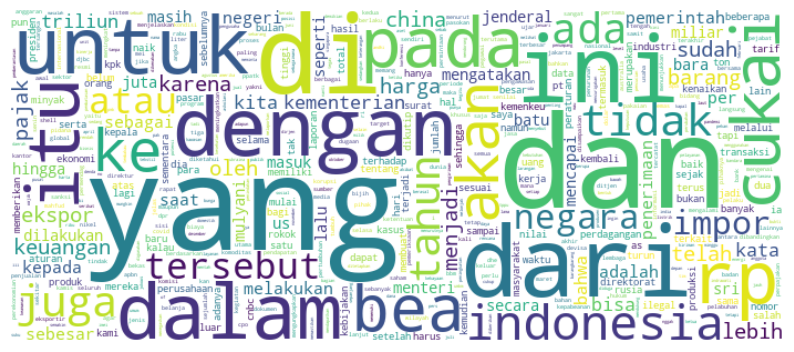

In [22]:
# Buat dictionary dari common_article
common_article_dict = dict(common_article)

# Buat word cloud dari 500 kata yang paling sering muncul
wordcloud = WordCloud(background_color="white",
                    width=700, height=300, max_font_size=120,
                    max_words=500, contour_color='blue',
                    contour_width=2).generate_from_frequencies(common_article_dict)

# Tampilkan word cloud
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [23]:
# memasukkan 500 sampel kata beserta jumlah kemunculan ke dalam dataframe

most_freq_df = pd.DataFrame(common_article, columns=['words','count'])
most_freq_df.sort_values(by='count', ascending=False)

,words,count
0,yang,16813
1,dan,15577
2,di,10856
3,dari,8621
4,ini,7687
...,...,...
495,upaya,217
496,tenaga,217
497,kontainer,217
498,asing,217


In [24]:
# mengurutkan kata sampel berdasarkan jumlah kemunculan yang diurutkan secara descending
# kemudian mengambil 15 kata sampel

most_freq_df.sort_values(by='count', ascending=False)
top15 = most_freq_df.iloc[:15]

C:\Users\Anjelita Malik\AppData\Local\Temp\ipykernel_18144\790074487.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='words', y='count', data=top15, palette = 'Set2')


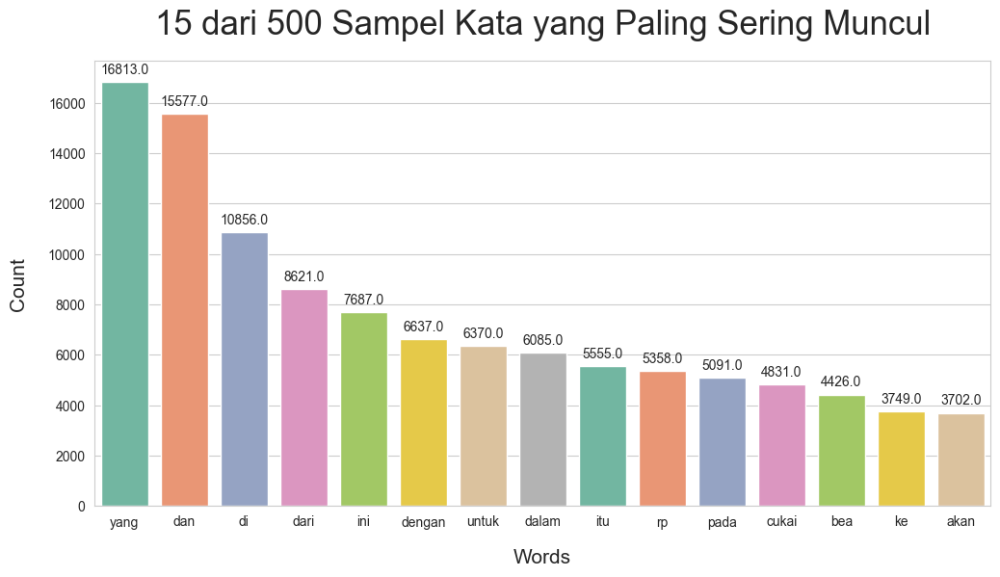

In [25]:
# membuat visualisasi 15 sampel kata yang paling sering ditulis di berita

plt.figure(figsize=(12,6))
sns.set_style('whitegrid')

ax = sns.barplot(x='words', y='count', data=top15, palette = 'Set2')
for annotate in ax.patches:
  ax.annotate(format(annotate.get_height(), '.1f'),
              (annotate.get_x() + annotate.get_width()/2.,
               annotate.get_height()), ha = 'center', va='center', xytext=(0,9),
               textcoords = 'offset points')
plt.title("15 dari 500 Sampel Kata yang Paling Sering Muncul", fontsize=25, pad=20)
plt.xlabel('Words', fontsize=15, labelpad=15)
plt.ylabel('Count', fontsize=15, labelpad=15)
plt.show()

# Remove Stopword in bahasa

In [26]:
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('popular')

[nltk_data] Downloading package stopwords to C:\Users\Anjelita
[nltk_data]     Malik\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to C:\Users\Anjelita
[nltk_data]    |     Malik\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to C:\Users\Anjelita
[nltk_data]    |     Malik\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to C:\Users\Anjelita
[nltk_data]    |     Malik\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to C:\Users\Anjelita
[nltk_data]    |     Malik\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package i

True

In [27]:
# menampilkan kata stopwords bahasa indonesia
indonesian_stop = stopwords.words('indonesian')

# menghitung jumlah kata stopwords bahasa indonesia
print('length of indonesian stopwords:', len(indonesian_stop))

length of indonesian stopwords: 758


In [28]:
# memasukkan stopwords bahasa indonesia ke dalam dataframe

stopwords_indo = pd.DataFrame(indonesian_stop, columns=['stopwords_indonenesia'])

In [29]:
# menyimpan stopwords bahasa indonesia ke dalam format xlsx
stopwords_indo.to_excel('stopwords_indonesian.xlsx', index=False)

## function that used to remove stopwords

In [30]:
def remove_stopwords(article_text, indo_stopwords):
  tokenize = []
  for token in article_text:
    if token not in indo_stopwords:
      tokenize.append(token)
  
  return tokenize

data['Stop_article'] = data['Token'].apply(lambda stop: remove_stopwords(stop, indonesian_stop))

In [31]:
data.head()

,Content,Token,Stop_article
0,pemerintah tengah bersiap merealisasikan ekspo...,"[pemerintah, tengah, bersiap, merealisasikan, ...","[pemerintah, merealisasikan, ekspor, pasir, la..."
1,direktur jenderal bea cukai kementerian keuang...,"[direktur, jenderal, bea, cukai, kementerian, ...","[direktur, jenderal, bea, cukai, kementerian, ..."
2,jakarta cnbc indonesia ketua umum ikatan pengu...,"[jakarta, cnbc, indonesia, ketua, umum, ikatan...","[jakarta, cnbc, indonesia, ketua, ikatan, peng..."
3,pengusaha tekstil di dalam negeri menyoroti pe...,"[pengusaha, tekstil, di, dalam, negeri, menyor...","[pengusaha, tekstil, negeri, menyoroti, pernya..."
4,presiden joko widodo jokowi memanggil beberapa...,"[presiden, joko, widodo, jokowi, memanggil, be...","[presiden, joko, widodo, jokowi, memanggil, me..."


# Stemming Normalization

In [32]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

In [33]:
def back_to_root(article_text):
  stop_token = ' '.join(article_text)
  stem = StemmerFactory()
  create_stem = stem.create_stemmer()
  result_stem = create_stem.stem(stop_token)
  return result_stem

data['Stem_article'] = data['Stop_article'].apply(lambda stem:back_to_root(stem))

In [34]:
data.head()

,Content,Token,Stop_article,Stem_article
0,pemerintah tengah bersiap merealisasikan ekspo...,"[pemerintah, tengah, bersiap, merealisasikan, ...","[pemerintah, merealisasikan, ekspor, pasir, la...",perintah realisasi ekspor pasir laut presiden ...
1,direktur jenderal bea cukai kementerian keuang...,"[direktur, jenderal, bea, cukai, kementerian, ...","[direktur, jenderal, bea, cukai, kementerian, ...",direktur jenderal bea cukai menteri uang askol...
2,jakarta cnbc indonesia ketua umum ikatan pengu...,"[jakarta, cnbc, indonesia, ketua, umum, ikatan...","[jakarta, cnbc, indonesia, ketua, ikatan, peng...",jakarta cnbc indonesia ketua ikat usaha konvek...
3,pengusaha tekstil di dalam negeri menyoroti pe...,"[pengusaha, tekstil, di, dalam, negeri, menyor...","[pengusaha, tekstil, negeri, menyoroti, pernya...",usaha tekstil negeri sorot nyata menteri uang ...
4,presiden joko widodo jokowi memanggil beberapa...,"[presiden, joko, widodo, jokowi, memanggil, be...","[presiden, joko, widodo, jokowi, memanggil, me...",presiden joko widodo jokowi panggil menteri ra...


In [35]:
data.to_csv('cnbc_result_stem.csv', index=False)

# Data Labeling

Teks berita masih belum mempunyai sentimen sehingga sulit untuk mencari tahu apakah berita tersebut bernilai positif atau negatif. Proses pemberian sentimen tidak mungkin dilakukan secara manual dengan melihat berita secara satu per satu karena membutuhkan waktu yang lama dan memerlukan seorang ahli di bidang bahasa yang dapat menafsirkan ulasan kemudian mengelompokkan ke sentimen positif dan negatif. Maka dari itu, saya melakukan proses pemberian label sentimen dengan menerapkan metode yang berbasis lexicon atau biasa dikenal dengan lexicon-based method. Kamus yang digunakan adalah InSet Lexicon yang terdiri dari kamus positif dan negatif.

## Connect to Google Drive

In [ ]:
# !gdown --id 1hOYYAYMGSd0JoqDcBxjhtVm6koOnk-KQ

In [ ]:
# !gdown --id 1HVydsM-fsSdIugnuSF6L9-Ai4UnRB_ju

In [70]:
# load the dataset
data = pd.read_csv("cnbc_result_stem.csv")

Menghapus baris yang hanya mengandung 'gambasvideo cnbc' dan menghilangkan frasa 'gambasvideo cnbc' dari baris teks berita lainnya tanpa harus mengulangi seluruh preprocessing

In [71]:
# Menghapus baris yang hanya mengandung 'gambasvideo cnbc' atau 'jakarta cnbc indonesia' pada kolom 'Content'
data = data[~data['Content'].isin(['gambasvideo cnbc', 'jakarta cnbc indonesia'])]

# Fungsi untuk menghapus frasa 'gambasvideo cnbc' dan 'jakarta cnbc indonesia' dari teks
def remove_phrases(text):
    phrases_to_remove = ['gambasvideo cnbc', 'jakarta cnbc indonesia']
    for phrase in phrases_to_remove:
        text = text.replace(phrase, '').strip()
    return text

# Menghapus frasa 'gambasvideo cnbc' dan 'jakarta cnbc indonesia' dari kolom 'Content' dan 'Stem_article'
data['Content'] = data['Content'].apply(remove_phrases)
data['Stem_article'] = data['Stem_article'].apply(remove_phrases)

# Menghapus baris yang kosong setelah penghapusan
data = data[data['Content'].str.strip() != '']

In [81]:
# Menyimpan data yang telah dibersihkan
data.to_csv('cnbc_result_reprocessing.csv', index=False)

In [105]:
# load the dataset
data = pd.read_csv("cnbc_result_reprocessing.csv")

## Read the positive and negative lexicon

In [106]:
lexicon_positive = dict()
import csv
with open('lexicon_positive_ver1.csv', 'r') as csvfile:
  reader = csv.reader(csvfile, delimiter=',')
  for row in reader:
    lexicon_positive[row[0]] = int(row[1])

lexicon_negative = dict()
import csv
with open('lexicon_negative_ver1.csv', 'r') as csvfile:
  reader = csv.reader(csvfile, delimiter=',')
  for row in reader:
    lexicon_negative[row[0]] = int(row[1])

## Create a function named sentiment_analysis_lexicon_indonesia which contains a for loop and if conditions to label each review

Teks berita diberi score terlebih dahulu dengan menyesuaikan dengan bobot kata yang terdapat di kamus. +5 untuk kata positif dan -5 untuk negatif. Setelah itu, bobot berita dijumlahkan kemudian di kelompokkan menjadi sentimen positif, negatif, dan netral. Netral ini diartikan sebagai hasil kalkulasi berita bernilai 0. Karena fokus analisis ini hanya sentimen positif dan negatif, maka berita yang mengandung sentimen netral nanti akan di hilangkan. 

In [107]:
def sentiment_analysis_lexicon_indonesia(text):
  score = 0
  for word_pos in text:
    if (word_pos in lexicon_positive):
      score = score + lexicon_positive[word_pos]
  for word_neg in text:
    if (word_neg in lexicon_negative):
      score = score + lexicon_negative[word_neg]
  polarity=''
  if (score > 0):
    polarity = 'positif'
  elif (score < 0):
    polarity = 'negatif'
  else:
    polarity = 'netral'
  
  return score, polarity

### Conduct functional tests on dummy sentences.

In [108]:
string = "sebab ini sangat buruk bagi rakyat"
string = string.split()
hasil = sentiment_analysis_lexicon_indonesia(string)
hasil

(-8, 'negatif')

### Separate the sentences in the stem_article column and then apply the sentiment_analysis_lexicon_indonesia function to that column

In [109]:
data['Prepos_article'] = data.Stem_article.str.split()

In [110]:
results = data['Prepos_article'].apply(sentiment_analysis_lexicon_indonesia)
results = list(zip(*results))
data['polarity_score'] = results[0]
data['polarity'] = results[1]
print(data['polarity'].value_counts())

polarity
negatif    1276
positif     507
netral       17
Name: count, dtype: int64


In [111]:
# mengonversikan whitespaces menjadi np.nan kemudian menghapusnya menggunakan fungsi dropna
# data = data.replace('',np.nan, regex=True)
# data = data.dropna()

In [112]:
# reset index tabel agar urutan menjadi penomoran menjadi lebih rapih
data = data.reset_index(drop=True)

In [113]:
print(data['polarity'].value_counts())

polarity
negatif    1276
positif     507
netral       17
Name: count, dtype: int64


In [114]:
data[(data['polarity']=='netral')]

,Content,Token,Stop_article,Stem_article,Prepos_article,polarity_score,polarity
21,menteri keuangan sri mulyani mengatakan pemeri...,"['menteri', 'keuangan', 'sri', 'mulyani', 'men...","['menteri', 'keuangan', 'sri', 'mulyani', 'pem...",menteri uang sri mulyani perintah strategi nam...,"[menteri, uang, sri, mulyani, perintah, strate...",0,netral
48,komisi pemberantasan korupsi kpk memanggil man...,"['komisi', 'pemberantasan', 'korupsi', 'kpk', ...","['komisi', 'pemberantasan', 'korupsi', 'kpk', ...",komisi berantas korupsi kpk panggil mantan kep...,"[komisi, berantas, korupsi, kpk, panggil, mant...",0,netral
219,direktorat jenderal bea dan cukai kementerian ...,"['direktorat', 'jenderal', 'bea', 'dan', 'cuka...","['direktorat', 'jenderal', 'bea', 'cukai', 'ke...",direktorat jenderal bea cukai menteri uang kum...,"[direktorat, jenderal, bea, cukai, menteri, ua...",0,netral
221,direktorat jenderal bea dan cukai djbc kemente...,"['direktorat', 'jenderal', 'bea', 'dan', 'cuka...","['direktorat', 'jenderal', 'bea', 'cukai', 'dj...",direktorat jenderal bea cukai djbc menteri uan...,"[direktorat, jenderal, bea, cukai, djbc, mente...",0,netral
296,calon presiden prabowo subianto mengkritik kin...,"['calon', 'presiden', 'prabowo', 'subianto', '...","['calon', 'presiden', 'prabowo', 'subianto', '...",calon presiden prabowo subianto kritik kerja d...,"[calon, presiden, prabowo, subianto, kritik, k...",0,netral
336,pemerintah dalam waktu dekat akan menerapkan t...,"['pemerintah', 'dalam', 'waktu', 'dekat', 'aka...","['pemerintah', 'menerapkan', 'tarif', 'jenis',...",perintah terap tarif jenis barang kirim impor ...,"[perintah, terap, tarif, jenis, barang, kirim,...",0,netral
356,direktorat jenderal bea dan cukai menyatakan t...,"['direktorat', 'jenderal', 'bea', 'dan', 'cuka...","['direktorat', 'jenderal', 'bea', 'cukai', 'me...",direktorat jenderal bea cukai pantau aktivitas...,"[direktorat, jenderal, bea, cukai, pantau, akt...",0,netral
424,pt pelabuhan indonesia persero berkomitmen unt...,"['pt', 'pelabuhan', 'indonesia', 'persero', 'b...","['pt', 'pelabuhan', 'indonesia', 'persero', 'b...",pt labuh indonesia persero komitmen cipta tran...,"[pt, labuh, indonesia, persero, komitmen, cipt...",0,netral
461,mafia hp ilegal terungkap akhir pekan lalu rat...,"['mafia', 'hp', 'ilegal', 'terungkap', 'akhir'...","['mafia', 'hp', 'ilegal', 'terungkap', 'pekan'...",mafia hp ilegal ungkap pekan ratus ribu handph...,"[mafia, hp, ilegal, ungkap, pekan, ratus, ribu...",0,netral
528,kementerian energi dan sumber daya mineral esd...,"['kementerian', 'energi', 'dan', 'sumber', 'da...","['kementerian', 'energi', 'sumber', 'daya', 'm...",menteri energi sumber daya mineral esdm beber ...,"[menteri, energi, sumber, daya, mineral, esdm,...",0,netral


### Delete review with neutral sentiment

In [115]:
# menghapus content yang bersentimen netral karena tujuan dari penelitian ini hanya menggunakan 2 sentimen yaitu positif dan negatif
data = data.drop(data[data['polarity'] == 'netral'].index)
data = data.reset_index(drop=True)

In [116]:
data.head(20)

,Content,Token,Stop_article,Stem_article,Prepos_article,polarity_score,polarity
0,pemerintah tengah bersiap merealisasikan ekspo...,"['pemerintah', 'tengah', 'bersiap', 'merealisa...","['pemerintah', 'merealisasikan', 'ekspor', 'pa...",perintah realisasi ekspor pasir laut presiden ...,"[perintah, realisasi, ekspor, pasir, laut, pre...",-12,negatif
1,direktur jenderal bea cukai kementerian keuang...,"['direktur', 'jenderal', 'bea', 'cukai', 'keme...","['direktur', 'jenderal', 'bea', 'cukai', 'keme...",direktur jenderal bea cukai menteri uang askol...,"[direktur, jenderal, bea, cukai, menteri, uang...",-39,negatif
2,ketua umum ikatan pengusaha konveksi berkarya ...,"['jakarta', 'cnbc', 'indonesia', 'ketua', 'umu...","['jakarta', 'cnbc', 'indonesia', 'ketua', 'ika...",ketua ikat usaha konveksi karya ipkb nandi her...,"[ketua, ikat, usaha, konveksi, karya, ipkb, na...",-58,negatif
3,pengusaha tekstil di dalam negeri menyoroti pe...,"['pengusaha', 'tekstil', 'di', 'dalam', 'neger...","['pengusaha', 'tekstil', 'negeri', 'menyoroti'...",usaha tekstil negeri sorot nyata menteri uang ...,"[usaha, tekstil, negeri, sorot, nyata, menteri...",-85,negatif
4,presiden joko widodo jokowi memanggil beberapa...,"['presiden', 'joko', 'widodo', 'jokowi', 'mema...","['presiden', 'joko', 'widodo', 'jokowi', 'mema...",presiden joko widodo jokowi panggil menteri ra...,"[presiden, joko, widodo, jokowi, panggil, ment...",15,positif
5,pemerintah dipastikan akan menaikkan tarif cuk...,"['pemerintah', 'dipastikan', 'akan', 'menaikka...","['pemerintah', 'menaikkan', 'tarif', 'cukai', ...",perintah naik tarif cukai rokok bijak harga ro...,"[perintah, naik, tarif, cukai, rokok, bijak, h...",-31,negatif
6,kekacauan terjadi di argentina rabu malam wakt...,"['kekacauan', 'terjadi', 'di', 'argentina', 'r...","['kekacauan', 'argentina', 'rabu', 'malam', 's...",kacau argentina rabu malam situasi panas kongr...,"[kacau, argentina, rabu, malam, situasi, panas...",-40,negatif
7,perekonomian masyarakat indonesia tengah dihan...,"['perekonomian', 'masyarakat', 'indonesia', 't...","['perekonomian', 'masyarakat', 'indonesia', 'd...",ekonomi masyarakat indonesia hantam masalah be...,"[ekonomi, masyarakat, indonesia, hantam, masal...",-78,negatif
8,menteri keuangan sri mulyani bersikeras mengha...,"['menteri', 'keuangan', 'sri', 'mulyani', 'ber...","['menteri', 'keuangan', 'sri', 'mulyani', 'ber...",menteri uang sri mulyani sikeras hapus angka b...,"[menteri, uang, sri, mulyani, sikeras, hapus, ...",10,positif
9,usulan anggaran kementerian keuangan sebesar r...,"['usulan', 'anggaran', 'kementerian', 'keuanga...","['usulan', 'anggaran', 'kementerian', 'keuanga...",usul anggar menteri uang rp triliun tolak komi...,"[usul, anggar, menteri, uang, rp, triliun, tol...",243,positif


### Sentiment visualization

C:\Users\Anjelita Malik\AppData\Local\Temp\ipykernel_18144\2826112183.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x='polarity', data=data, palette="pastel")


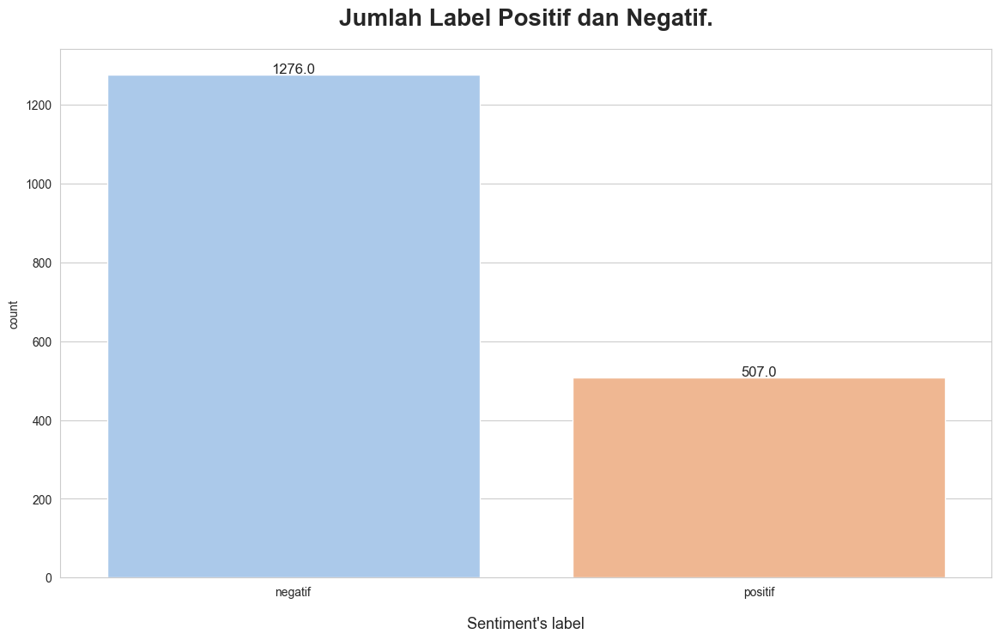

In [117]:
# membuat visualisasi bar chart untuk menampilkan jumlah sentimen positif dan negatif

fig, ax = plt.subplots(figsize=(14,8))
ax = sns.countplot(x='polarity', data=data, palette="pastel")

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 3.25,rect.get_height(),horizontalalignment='center', fontsize = 12)

plt.title("Jumlah Label Positif dan Negatif.", fontsize=20, fontweight='bold',pad=20)
plt.xlabel("Sentiment's label", fontsize=13, labelpad=15)
plt.ylim(0)
plt.show()

In [118]:
# mengonversikan sentimen menjadi 1 untuk positif dan -1 untuk negatif
polarity = []
for convert in data['polarity']:
  if convert == "positif":
    num_polarity = 1
  else:
    num_polarity = -1

  polarity.append(num_polarity)
data['polarity'] = polarity

In [119]:
data['polarity'] 

0      -1
1      -1
2      -1
3      -1
4       1
       ..
1778   -1
1779   -1
1780   -1
1781   -1
1782   -1
Name: polarity, Length: 1783, dtype: int64

In [120]:
print("percentage of sentiment:")
train_pct_pos = data.polarity.value_counts()[1]/data.polarity.value_counts().sum()*100
print("percentage of positive sentiment:", round(train_pct_pos,2), '%')

train_pct_neg = data.polarity.value_counts()[-1]/data.polarity.value_counts().sum()*100
print("percentage of negative sentiment:", round(train_pct_neg,2), '%')

print("difference between percentage positive and negative:", round(train_pct_pos-train_pct_neg,2), '%')

percentage of sentiment:
percentage of positive sentiment: 28.44 %
percentage of negative sentiment: 71.56 %
difference between percentage positive and negative: -43.13 %


### Sentiment WordCloud

#### Wordcloud for positive sentiment

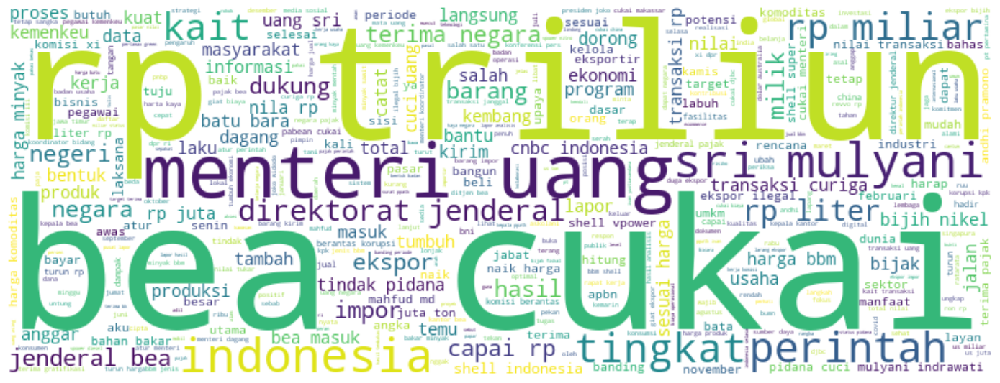

In [121]:
sentiment_pos = ' '.join([review for review in data['Stem_article'][data['polarity'] == 1]])

# create object wordcloud
w_pos = WordCloud(background_color="white",
                  width=800, height=300, max_font_size=200,
                  max_words=500).generate(sentiment_pos)

plt.figure(figsize=(14,8))
plt.axis("off")
plt.tight_layout()
plt.imshow(w_pos, interpolation="bilinear")
plt.show()

#### Wordcloud for negative sentiment

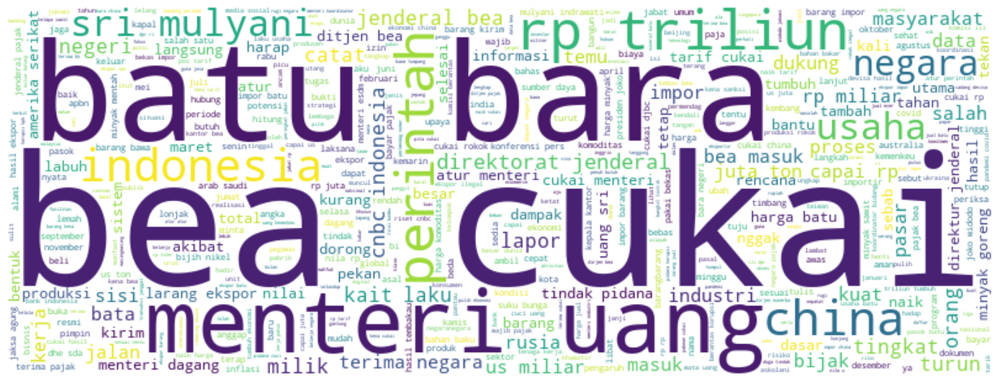

In [122]:
sentiment_neg = ' '.join([review for review in data['Stem_article'][data['polarity'] == -1]])

# create object wordcloud
w_neg = WordCloud(background_color="white",
                  width=800, height=300, max_font_size=200,
                  max_words=500).generate(sentiment_neg)

plt.figure(figsize=(14,8))
plt.axis("off")
plt.tight_layout()
plt.imshow(w_neg, interpolation="bilinear")
plt.show()

In [123]:
data = data.replace('',np.nan, regex=True)

In [124]:
data = data.dropna()

In [125]:
data = data.reset_index(drop=True)

In [127]:
data.to_csv("cnbc_fix_dataset.csv", index=False)

### Text Vectorization

Mengubah kata-kata tersebut menjadi representasi numerik yang bisa diproses oleh model pembelajaran mesin. Fungsi Tokenizer dari Keras digunakan untuk mengubah teks menjadi urutan angka yang dapat dimasukkan ke dalam model LSTM. Hal ini penting karena model pembelajaran mesin bekerja dengan data numerik, bukan teks mentah.

Tokenizing addalah proses pemotongan string input berdasarkan kata penyusunnya. Kami menggunakan keras untuk mentokenisasi konten berita dengan memotong (memilih) 300 kata yang paling sering dipakai, dan menjadikan 300 kata tersebut (text corpus) menjadi vektor.

In [41]:
# load the dataset
data = pd.read_csv("cnbc_fix_dataset.csv")

In [42]:
data.head(5)

,Content,Token,Stop_article,Stem_article,Prepos_article,polarity_score,polarity
0,pemerintah tengah bersiap merealisasikan ekspo...,"['pemerintah', 'tengah', 'bersiap', 'merealisa...","['pemerintah', 'merealisasikan', 'ekspor', 'pa...",perintah realisasi ekspor pasir laut presiden ...,"['perintah', 'realisasi', 'ekspor', 'pasir', '...",-12,-1
1,direktur jenderal bea cukai kementerian keuang...,"['direktur', 'jenderal', 'bea', 'cukai', 'keme...","['direktur', 'jenderal', 'bea', 'cukai', 'keme...",direktur jenderal bea cukai menteri uang askol...,"['direktur', 'jenderal', 'bea', 'cukai', 'ment...",-39,-1
2,ketua umum ikatan pengusaha konveksi berkarya ...,"['jakarta', 'cnbc', 'indonesia', 'ketua', 'umu...","['jakarta', 'cnbc', 'indonesia', 'ketua', 'ika...",ketua ikat usaha konveksi karya ipkb nandi her...,"['ketua', 'ikat', 'usaha', 'konveksi', 'karya'...",-58,-1
3,pengusaha tekstil di dalam negeri menyoroti pe...,"['pengusaha', 'tekstil', 'di', 'dalam', 'neger...","['pengusaha', 'tekstil', 'negeri', 'menyoroti'...",usaha tekstil negeri sorot nyata menteri uang ...,"['usaha', 'tekstil', 'negeri', 'sorot', 'nyata...",-85,-1
4,presiden joko widodo jokowi memanggil beberapa...,"['presiden', 'joko', 'widodo', 'jokowi', 'mema...","['presiden', 'joko', 'widodo', 'jokowi', 'mema...",presiden joko widodo jokowi panggil menteri ra...,"['presiden', 'joko', 'widodo', 'jokowi', 'pang...",15,1


In [43]:
# Tokenizing and padding sequences
max_features = 2000  # Adjust as necessary
max_length = 300

In [44]:
# Initialize Tokenizer
tokenizer = Tokenizer(num_words=max_features)
tokenizer.fit_on_texts(data['Stem_article'].values)

# Convert texts to sequences
X = tokenizer.texts_to_sequences(data['Stem_article'].values)
X = pad_sequences(X, padding='post', maxlen=max_length)


In [45]:
from sklearn.preprocessing import LabelBinarizer

In [46]:
# Convert -1 to 0
data['polarity'] = data['polarity'].apply(lambda x: 0 if x == -1 else 1)

# Ensure labels are 0 and 1
print(data['polarity'].unique())  # Should show [0, 1]

# Convert labels to binary format using LabelBinarizer
lb = LabelBinarizer()
Y = lb.fit_transform(data['polarity'])

# Ensure labels are still 0 and 1
print(lb.classes_)  # Should show [0, 1]
print(Y[:5])  # Print first 5 for sanity check

# Split data into train and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=42)


[0 1]
[0 1]
[[0]
 [0]
 [0]
 [0]
 [1]]


### Splitting Data Train-Tes

Pada sesi ini kami menggunakan Prinsip Pareto yakni memecah dataset dengan proporsi 80:20 untuk data train dan validasi.

In [47]:
embed_dim = 150

model = Sequential()
model.add(Embedding(max_features, embed_dim, input_length=X.shape[1]))
model.add(Bidirectional(LSTM(256, dropout=0.2, return_sequences=True)))
model.add(LSTM(128, dropout=0.2))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


c:\Users\Anjelita Malik\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\core\embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [48]:
batch_size = 32
epochs = 100

# Membuat callback EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',  # Metrik yang dipantau (bisa juga 'val_accuracy')
    patience=3,          # Jumlah epoch untuk menunggu sebelum berhenti jika tidak ada perbaikan
    min_delta=0.001,     # Perubahan minimum yang dianggap sebagai perbaikan
    mode='min',          # 'min' untuk loss, 'max' untuk accuracy
    restore_best_weights=True  # Mengembalikan bobot terbaik yang ditemukan selama pelatihan
)

# Menambahkan callback ke model.fit
history = model.fit(
    X_train, Y_train,
    epochs=epochs,  # Jumlah maksimum epoch
    batch_size=batch_size,
    validation_data=(X_test, Y_test),
    callbacks=[early_stopping],  # Menambahkan callback
    verbose=1
)


Epoch 1/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 112s 2s/step - accuracy: 0.6876 - loss: 0.6489 - val_accuracy: 0.7675 - val_loss: 0.5536
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 94s 2s/step - accuracy: 0.6856 - loss: 0.6273 - val_accuracy: 0.7675 - val_loss: 0.5575
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.6986 - loss: 0.6128 - val_accuracy: 0.7675 - val_loss: 0.5577
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.7114 - loss: 0.6138 - val_accuracy: 0.7619 - val_loss: 0.5715


### Build The Model

In [49]:
# Evaluate the model
pred = model.predict(X_test)

# Inverse transform predictions and true labels
Y_test_inv = lb.inverse_transform(Y_test)
pred_inv = lb.inverse_transform((pred > 0.5).astype(int))

print(classification_report(Y_test_inv, pred_inv))


12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 566ms/step
              precision    recall  f1-score   support

           0       0.77      1.00      0.87       274
           1       0.00      0.00      0.00        83

    accuracy                           0.77       357
   macro avg       0.38      0.50      0.43       357
weighted avg       0.59      0.77      0.67       357



c:\Users\Anjelita Malik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Anjelita Malik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Anjelita Malik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh

Kami sebenarnya membangun 3 jenis model 1 model pretrainned BERT-lite, satu model LSTM single layer, dan satu model LSTM double layer. Namun, berdasarkan pengujian yang kami lakukan, dipilih model LSTM double layer karena memberikan F1-score accuracy yang paling baik.

Pada model yang kami buat, sebelum masuk ke layer LSTM data di-embed terlebih dahulu dengan embedding milik library keras dengan embed dimension 150

In [12]:
# Check shape of X to ensure dimensions are correct
print(X.shape)

(1783, 300)


In [18]:
X_train.shape

(1426, 300)

In [19]:
X_test.shape

(357, 300)

In [20]:
X_train

array([[  48,   30,    3, ...,    0,    0,    0],
       [  48,   30,    3, ...,    0,    0,    0],
       [  80,  375,  402, ...,    0,    0,    0],
       ...,
       [  80, 1478,  994, ...,    0,    0,    0],
       [  15,  601,  537, ...,    0,    0,    0],
       [  15,  177,   66, ...,    0,    0,    0]])

In [21]:
print(X_train)

[[  48   30    3 ...    0    0    0]
 [  48   30    3 ...    0    0    0]
 [  80  375  402 ...    0    0    0]
 ...
 [  80 1478  994 ...    0    0    0]
 [  15  601  537 ...    0    0    0]
 [  15  177   66 ...    0    0    0]]


In [23]:
Y_train.shape

(1426, 2)

In [13]:
embed_dim = 150

model = Sequential()
model.add(Embedding(max_features, embed_dim, input_length=X.shape[1]))
model.add(Bidirectional(LSTM(256, dropout=0.2, return_sequences=True)))
model.add(LSTM(128, dropout=0.2))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dense(Y_train.shape[1], activation='softmax'))

c:\Users\Anjelita Malik\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\core\embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Pada model ini kami menggunakan loss categorical_crossentropy dan optimizer adam dengan metric accuracy

In [14]:
# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Force the model to build by training on a small batch of real data
model.fit(X_train[:1], Y_train[:1], epochs=1, batch_size=1, verbose=1)

# Summarize the model
model.summary()

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step - accuracy: 0.0000e+00 - loss: 0.6951


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (1, 300, 150)          │       300,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional (Bidirectional)   │ (1, 300, 512)          │       833,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (1, 128)               │       328,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (1, 128)               │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (1, 128)               │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (1, 64)                │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (1, 2)                 │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,459,880 (17.01 MB)

 Trainable params: 1,486,626 (5.67 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,973,254 (11.34 MB)

In [15]:
batch_size = 32
epochs = 100
# Membuat callback EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',  # Metrik yang dipantau (bisa juga 'val_accuracy')
    patience=3,          # Jumlah epoch untuk menunggu sebelum berhenti jika tidak ada perbaikan
    min_delta=0.001,     # Perubahan minimum yang dianggap sebagai perbaikan
    mode='min',          # 'min' untuk loss, 'max' untuk accuracy
    restore_best_weights=True  # Mengembalikan bobot terbaik yang ditemukan selama pelatihan
)

# Menambahkan callback ke model.fit
history = model.fit(
    X_train, Y_train,
    epochs=epochs,  # Jumlah maksimum epoch
    batch_size=batch_size,
    validation_data=(X_test, Y_test),
    callbacks=[early_stopping],  # Menambahkan callback
    verbose=1
)

Epoch 1/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.7179 - loss: 0.6344 - val_accuracy: 0.7675 - val_loss: 0.5629
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.7058 - loss: 0.6134 - val_accuracy: 0.7675 - val_loss: 0.5414
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 92s 2s/step - accuracy: 0.6963 - loss: 0.6150 - val_accuracy: 0.7675 - val_loss: 0.5477
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 147s 2s/step - accuracy: 0.7248 - loss: 0.5894 - val_accuracy: 0.7563 - val_loss: 0.5726
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 96s 2s/step - accuracy: 0.7428 - loss: 0.5619 - val_accuracy: 0.7647 - val_loss: 0.5908


### Predicting Validation

Pengecekan terhadap data validasi dan membaca classificaiton report terlebih dahulu

In [50]:
pred = model.predict(X_test)

print(classification_report(Y_test.argmax(axis=1), pred.argmax(axis=1)))

12/12 ━━━━━━━━━━━━━━━━━━━━ 5s 421ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       357

    accuracy                           1.00       357
   macro avg       1.00      1.00      1.00       357
weighted avg       1.00      1.00      1.00       357



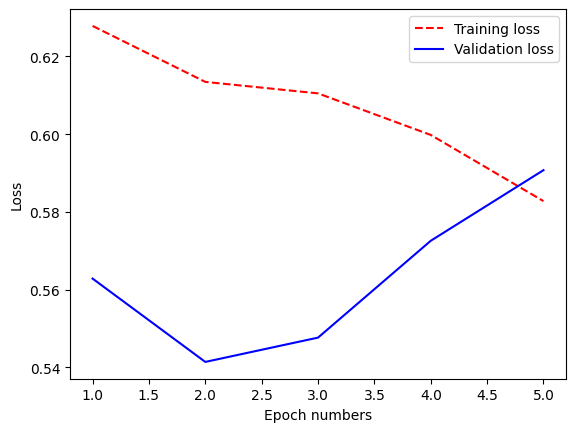

In [17]:
epoch_num = range(1, len(history.history["loss"]) + 1)
plt.plot(epoch_num, history.history["loss"], "r--")
plt.plot(epoch_num, history.history["val_loss"], "b-")
plt.legend(["Training loss", "Validation loss"])
plt.xlabel("Epoch numbers")
plt.ylabel("Loss")
plt.show()

In [32]:
print("Train label distribution:")
print(pd.Series(Y_train.argmax(axis=1)).value_counts())

print("Test label distribution:")
print(pd.Series(Y_test.argmax(axis=1)).value_counts())


Train label distribution:
0    1002
1     424
Name: count, dtype: int64
Test label distribution:
0    274
1     83
Name: count, dtype: int64


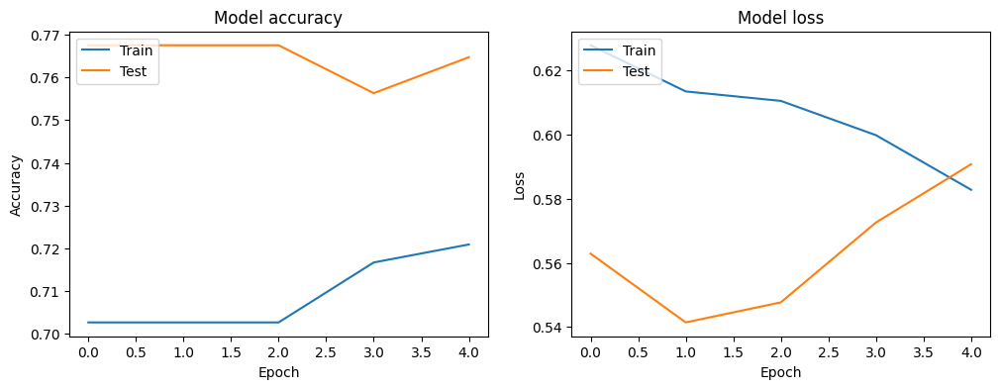

In [33]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

plt.show()

In [34]:
# Prediksi pada data uji
pred = model.predict(X_test)
pred_classes = pred.argmax(axis=1)
true_classes = Y_test.argmax(axis=1)

# Cek prediksi dan label asli
print("Sample predictions:", pred_classes[:10])
print("Sample true labels:", true_classes[:10])

# Confusion Matrix
matrix = confusion_matrix(true_classes, pred_classes)
print(matrix)

12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 437ms/step
Sample predictions: [0 0 0 0 0 0 0 0 0 0]
Sample true labels: [0 0 0 0 0 1 1 0 0 1]
[[274   0]
 [ 83   0]]


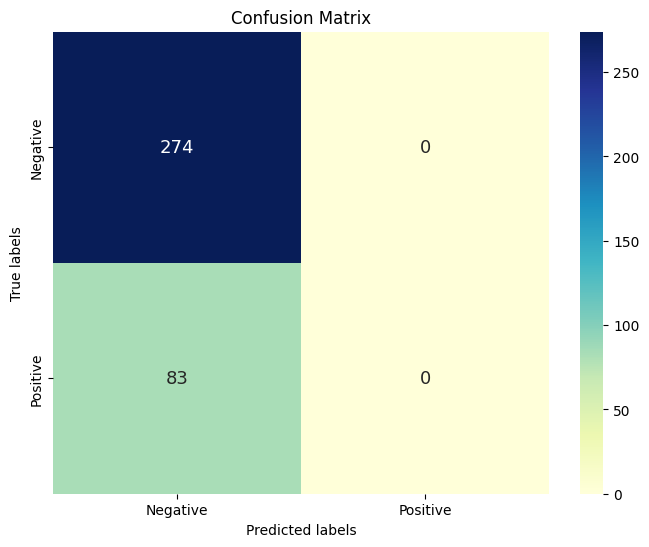

In [35]:
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(pd.DataFrame(matrix), annot=True, cmap="YlGnBu" ,fmt='g', annot_kws={"fontsize":13})
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Negative', 'Positive'])
ax.yaxis.set_ticklabels(['Negative', 'Positive'])
plt.show()

In [31]:
pred_classes = pred.argmax(axis=1)
true_classes = Y_test.argmax(axis=1)
# Confusion Matrix
matrix = confusion_matrix(true_classes, pred_classes)
print(matrix)

[[274   0]
 [ 83   0]]


In [26]:
pred

array([[0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.74697804, 0.25302204],
       [0.7678784 , 0.23212162],
       [0.76787835, 0.23212166],
       [0.7538855 , 0.24611443],
       [0.7678784 , 0.23212162],
       [0.76787376, 0.23212619],
       [0.7315929 , 0.26840714],
       [0.76323986, 0.23676017],
       [0.8104513 , 0.18954867],
       [0.7678784 , 0.23212162],
       [0.76787835, 0.23212162],
       [0.7678784 , 0.23212162],
       [0.75805885, 0.24194117],
       [0.7678783 , 0.23212174],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.76778466, 0.23221529],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.7678784 , 0.23212162],
       [0.

In [ ]:
# Assuming `test_data` is your test dataset
test_data = pd.read_csv('test.csv')  # or any other way you are loading the test data
test_data['Prepos_article'] = test_data['konten_berita'].apply(clear_content)  # Assuming clear_content is defined

X_sub = tokenizer.texts_to_sequences(test_data['Prepos_article'].values)
X_sub = pad_sequences(X_sub, padding='post', maxlen=max_length)
pred_test = model.predict(X_sub)

submission = test_data[['id']]
submission['sentimen_berita'] = [labels[x] for x in pred_test.argmax(axis=1)]  # Assuming 'labels' is defined as in your example

# Save to a file
submission.to_csv('submission.csv', index=False)


In [51]:
# Load the dataset
data = pd.read_csv("cnbc_fix_dataset.csv")
print(data.head(5))

                                             Content  \
0  pemerintah tengah bersiap merealisasikan ekspo...   
1  direktur jenderal bea cukai kementerian keuang...   
2  ketua umum ikatan pengusaha konveksi berkarya ...   
3  pengusaha tekstil di dalam negeri menyoroti pe...   
4  presiden joko widodo jokowi memanggil beberapa...   

                                               Token  \
0  ['pemerintah', 'tengah', 'bersiap', 'merealisa...   
1  ['direktur', 'jenderal', 'bea', 'cukai', 'keme...   
2  ['jakarta', 'cnbc', 'indonesia', 'ketua', 'umu...   
3  ['pengusaha', 'tekstil', 'di', 'dalam', 'neger...   
4  ['presiden', 'joko', 'widodo', 'jokowi', 'mema...   

                                        Stop_article  \
0  ['pemerintah', 'merealisasikan', 'ekspor', 'pa...   
1  ['direktur', 'jenderal', 'bea', 'cukai', 'keme...   
2  ['jakarta', 'cnbc', 'indonesia', 'ketua', 'ika...   
3  ['pengusaha', 'tekstil', 'negeri', 'menyoroti'...   
4  ['presiden', 'joko', 'widodo', 'jokowi', 'm

In [52]:
# Tokenizing and padding sequences
max_features = 2000  # Adjust as necessary
max_length = 300

# Initialize Tokenizer
tokenizer = Tokenizer(num_words=max_features)
tokenizer.fit_on_texts(data['Stem_article'].values)

# Convert texts to sequences
X = tokenizer.texts_to_sequences(data['Stem_article'].values)
X = pad_sequences(X, padding='post', maxlen=max_length)


In [53]:
# Convert -1 to 0
data['polarity'] = data['polarity'].apply(lambda x: 0 if x == -1 else 1)

# Ensure labels are 0 and 1
print(data['polarity'].unique())  # Should show [0, 1]

# Convert labels to binary format using LabelBinarizer
Y = data['polarity'].values

# Split data into train and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=42)


[0 1]


In [54]:
embed_dim = 150

model = Sequential()
model.add(Embedding(max_features, embed_dim, input_length=X.shape[1]))
model.add(Bidirectional(LSTM(256, dropout=0.2, return_sequences=True)))
model.add(LSTM(128, dropout=0.2))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


c:\Users\Anjelita Malik\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\core\embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [55]:
batch_size = 32
epochs = 100

# Membuat callback EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',  # Metrik yang dipantau (bisa juga 'val_accuracy')
    patience=3,          # Jumlah epoch untuk menunggu sebelum berhenti jika tidak ada perbaikan
    min_delta=0.001,     # Perubahan minimum yang dianggap sebagai perbaikan
    mode='min',          # 'min' untuk loss, 'max' untuk accuracy
    restore_best_weights=True  # Mengembalikan bobot terbaik yang ditemukan selama pelatihan
)

# Menambahkan callback ke model.fit
history = model.fit(
    X_train, Y_train,
    epochs=epochs,  # Jumlah maksimum epoch
    batch_size=batch_size,
    validation_data=(X_test, Y_test),
    callbacks=[early_stopping],  # Menambahkan callback
    verbose=1
)


Epoch 1/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 143s 3s/step - accuracy: 0.6962 - loss: 0.6439 - val_accuracy: 0.7675 - val_loss: 0.5794
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 102s 2s/step - accuracy: 0.6907 - loss: 0.6275 - val_accuracy: 0.7675 - val_loss: 0.5422
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 96s 2s/step - accuracy: 0.7168 - loss: 0.5942 - val_accuracy: 0.7619 - val_loss: 0.6296
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 100s 2s/step - accuracy: 0.7223 - loss: 0.6243 - val_accuracy: 0.7619 - val_loss: 0.5834
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 95s 2s/step - accuracy: 0.7128 - loss: 0.6016 - val_accuracy: 0.7619 - val_loss: 0.5782


In [56]:
# Evaluate the model
pred = model.predict(X_test)

# Binarize predictions with a threshold of 0.5
pred_binary = (pred > 0.5).astype(int).flatten()

# Print classification report
print(classification_report(Y_test, pred_binary))


12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 603ms/step
              precision    recall  f1-score   support

           0       0.77      1.00      0.87       274
           1       0.00      0.00      0.00        83

    accuracy                           0.77       357
   macro avg       0.38      0.50      0.43       357
weighted avg       0.59      0.77      0.67       357



c:\Users\Anjelita Malik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Anjelita Malik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Anjelita Malik\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this beh